In [1]:
%pylab inline
from scipy.integrate import odeint


Populating the interactive namespace from numpy and matplotlib


# Homework 1

In [2]:
def net_force(x):
    R = sqrt((1. + 2.*x[0]**2.)**3.)/2.
    ug = array([0., -1.])
#     ut = array([1, 2*x[0]])/sqrt(4*x[0]**2 + 1)
    un = array([-2*x[0], 1])/sqrt(4*x[0]**2 + 1)
    V2 = (x[2]**2+x[3]**2)  
    N = (V2/R)*m + m*g*(ug.dot(-un))
    if x[0]**2 < x[1]:
        N = 0
    
    return N, un, ug

def physics(Δt, x):
         
    if x[0] < 1:
        N, un, ug = net_force(x)    
        Ftotal = N*un + m*g*ug
        
    elif x[0] >= 1:
        N=0
        Ftotal = -g*array([0., 1.])
        if x[1] <= 0 :
            x[1] = 0.
            x[3] = -x[3]*0.7

    dx = concatenate((x[2:4], Ftotal/m), axis=None)  
    x += dx * Δt
    
    return [x]

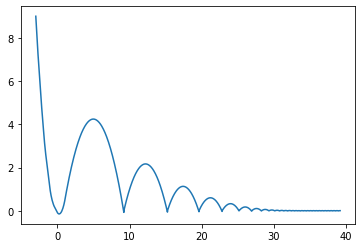

In [3]:
tf = 10.
Δt = 0.01    # Time step
time = linspace(0.,tf, int(tf / Δt) + 1)  # Time interval
g = 9.8
m = 1.

dx_0 = array([0., 0.])
x_0 = array([-3., 9.])

x = array([-3., 9., 0., 0.,])


x_log = [copy(x)]

for t in time:
    [x] = physics(Δt, x)
    x_log.append(copy(x))

x_log = array(x_log)
plot(x_log[:,0], x_log[:,1])

1001


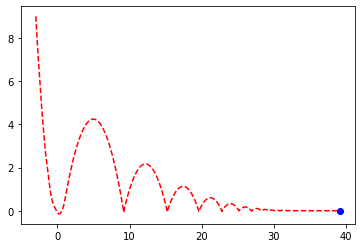

In [4]:
import matplotlib.pyplot as plt
from matplotlib import animation
from JSAnimation import IPython_display    
from IPython.display import HTML
    


fig, ax = plt.subplots()
x_log = array(x_log)

def animate(t):
    ax.clear()
    
    # Path
#     plot(x_log[:,0], x_log[:,1])

    plot(x_log[:,0], x_log[:,1], 'r--')
    
    # Initial conditions
    plot(x_log[t,0], x_log[t,1], 'bo')
#     plt.quiver()
    
    
print(len(time))

anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=30)

HTML(anim.to_jshtml())